# DCGAN
全称Deep Convolutional Genrative Adversarial Networks  
MNIST数据集变为使用image格式

In [1]:
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [2]:
# PyTorch TensorBoard support
from torch.utils.tensorboard import SummaryWriter

In [3]:
dataroot = r"/home/cxmd/文档/data_for_AI_train/mnist_data/DataImage"
batch_size = 128
workers = 2          # 处理数据的线程数量
image_size = 64      # 输入图像的宽和高
nz = 100            # 隐藏变量的维度
ngf = 64            # 生成器中特征图的大小
ndf = 64            # 判别器中特征映射的大小
num_epochs = 200         # 训练的轮数
lr = 0.0002         # 学习率
beta1 = 0.5         # Adam优化器的beta1参数
nc = 3              # 输入图像的通道数
ngpu = 1            # 使用的GPU数量，使用0表示cpu模式

In [4]:
os.makedirs("./demo1_1_outf", exist_ok=True)

## MNISR 数据集

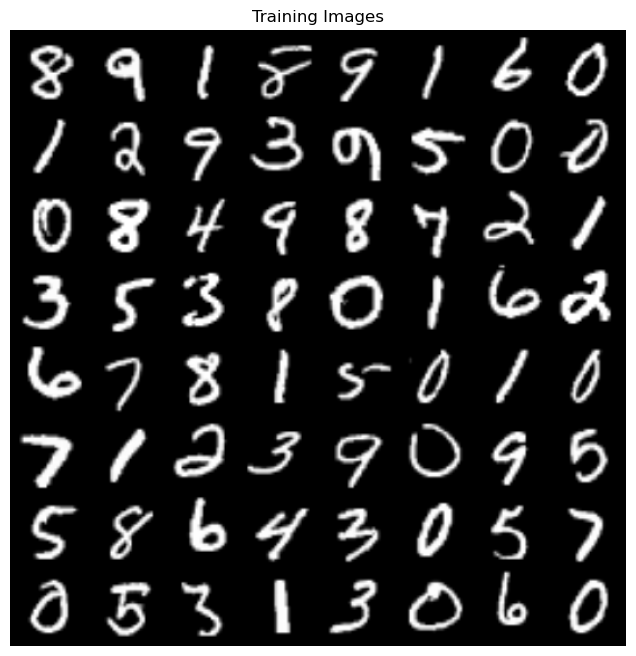

In [5]:
# 我们可以按照设置的方式使用图像文件夹数据集。
# 创建数据集
dataset = dset.ImageFolder(
    root=dataroot,
    transform=transforms.Compose(
        [
            transforms.Resize(image_size),
            transforms.CenterCrop(image_size),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ]
    ),
)
# 创建加载器
dataloader = torch.utils.data.DataLoader(
    dataset, batch_size=batch_size, shuffle=True, num_workers=workers
)

# 选择我们运行在上面的设备
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# 绘制部分我们的输入图像
real_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(
    np.transpose(
        vutils.make_grid(
            real_batch[0].to(device)[:64], padding=2, normalize=True
        ).cpu(),
        (1, 2, 0),
    )
)
plt.show()

## 生成器和判别器的创建

In [6]:
# 自定义权重初始化函数，用于在netG和netD上调用
def weights_init(m):
    # 获取模块的类名
    classname = m.__class__.__name__
    # 如果模块是卷积层
    if classname.find('Conv') != -1:
        # 使用均值为0，标准差为0.02的正态分布初始化权重
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    # 如果模块是批量归一化层
    elif classname.find('BatchNorm') != -1:
        # 使用均值为1，标准差为0.02的正态分布初始化权重
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        # 使用常数0初始化偏置
        nn.init.constant_(m.bias.data, 0)

In [7]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            # state size. (ngf*16) x 4 x 4
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 8 x 8
            nn.ConvTranspose2d( ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 16 x 16
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf * 2) x 32 x 32
            nn.ConvTranspose2d( ngf * 2, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)


In [8]:
netG = Generator(ngpu).to(device)
print(netG)

# 写入tensorboard
writerG = SummaryWriter('./demo1_1_outf/Generator')
input_to_netG = torch.randn(batch_size, nz, 1, 1, device=device)
writerG.add_graph(netG, input_to_model=input_to_netG)
writerG.close()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()


In [9]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [10]:
# 创建判别器
netD = Discriminator(ngpu).to(device)
# 应用weights_init函数随机初始化所有权重，mean= 0，stdev = 0.2
netD.apply(weights_init)
# 打印模型
print(netD)


# 写入tensorboard
writerD = SummaryWriter('./demo1_1_outf/Discriminator')
input_to_netD = torch.randn(batch_size, nc, 64, 64, device=device)
writerD.add_graph(netD, input_to_model=input_to_netD)
writerD.close()

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [11]:
# 初始化BCELoss函数
criterion = nn.BCELoss()

# 创建一批潜在的向量，我们将用它来可视化生成器的进程
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# 在训练期间建立真假标签的惯例
real_label = 1
fake_label = 0

# 为 G 和 D 设置 Adam 优化器
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

## 训练

In [12]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
# 跟踪数据
writer = SummaryWriter(log_dir='./demo1_1_outf/')

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # 对于数据加载器中的每个batch
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device).float()
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        
        # tensorbroad跟踪数据
        writer.add_scalar('Loss_D', errD.item(), epoch*len(dataloader)+i)
        writer.add_scalar('Loss_G', errG.item(), epoch*len(dataloader)+i)
        writer.add_scalar('D(x)', D_x, epoch*len(dataloader)+i)
        writer.add_scalar('D(G(z1))', D_G_z1, epoch*len(dataloader)+i)
        writer.add_scalar('D(G(z2))', D_G_z2, epoch*len(dataloader)+i)

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
    
    if (epoch+1) % 10 == 0:
        torch.save(netG.state_dict(), f'./demo1_1_outf/netG_epoch_{epoch+1}.pth')
        torch.save(netD.state_dict(), f'./demo1_1_outf/netD_epoch_{epoch+1}.pth')
writer.close()

Starting Training Loop...
[0/5][0/547]	Loss_D: 1.1197	Loss_G: 3.0844	D(x): 0.5223	D(G(z)): 0.3019 / 0.0592
[0/5][50/547]	Loss_D: 0.1056	Loss_G: 8.2907	D(x): 0.9723	D(G(z)): 0.0676 / 0.0003
[0/5][100/547]	Loss_D: 0.0004	Loss_G: 25.2498	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[0/5][150/547]	Loss_D: 0.0212	Loss_G: 6.1419	D(x): 0.9901	D(G(z)): 0.0108 / 0.0023
[0/5][200/547]	Loss_D: 0.0209	Loss_G: 6.5676	D(x): 0.9905	D(G(z)): 0.0098 / 0.0015
[0/5][250/547]	Loss_D: 0.0046	Loss_G: 7.7154	D(x): 0.9967	D(G(z)): 0.0012 / 0.0005
[0/5][300/547]	Loss_D: 0.0021	Loss_G: 7.9773	D(x): 0.9988	D(G(z)): 0.0008 / 0.0004
[0/5][350/547]	Loss_D: 0.0022	Loss_G: 7.4335	D(x): 0.9988	D(G(z)): 0.0011 / 0.0006
[0/5][400/547]	Loss_D: 0.0024	Loss_G: 7.1164	D(x): 0.9998	D(G(z)): 0.0022 / 0.0008
[0/5][450/547]	Loss_D: 0.0023	Loss_G: 6.8863	D(x): 0.9998	D(G(z)): 0.0021 / 0.0011
[0/5][500/547]	Loss_D: 0.0052	Loss_G: 6.6952	D(x): 0.9999	D(G(z)): 0.0050 / 0.0013
[1/5][0/547]	Loss_D: 0.0017	Loss_G: 7.8375	D(x): 0.9988	D(G(z))

## 检查成果

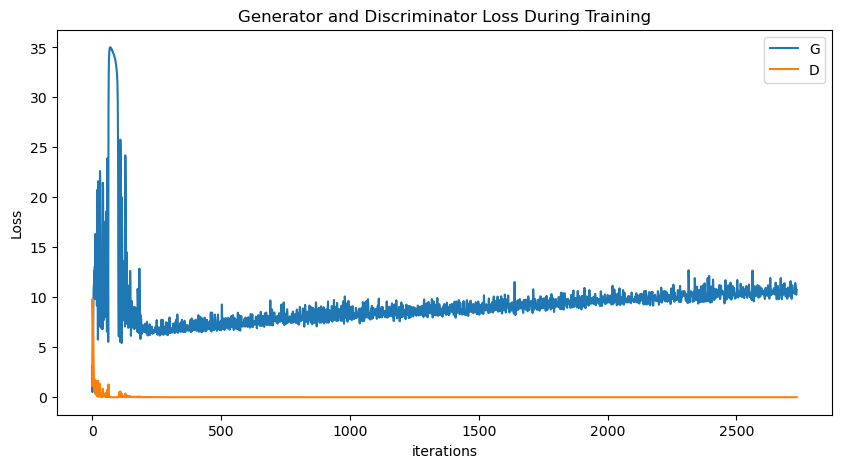

In [13]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

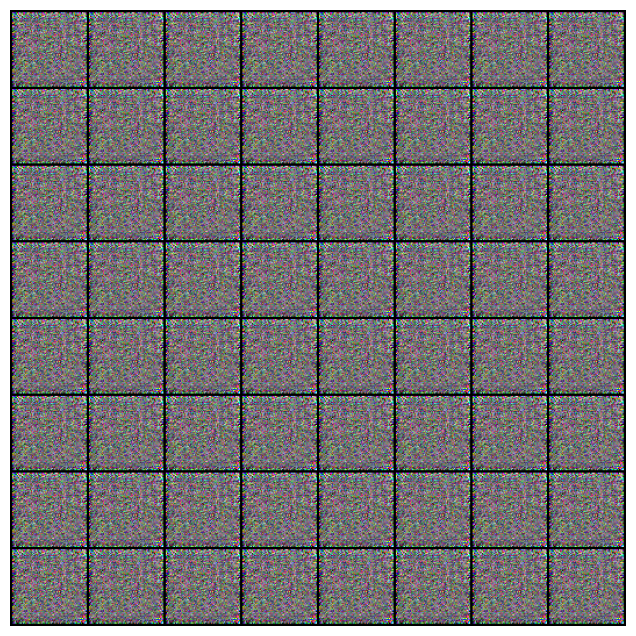

In [14]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())